# Contextualization and Problematic

## Contextualization:

The project utilizes a dataset from Kaggle about the costs and profitability of food delivery in New Delhi, available at  [https://www.kaggle.com/datasets/romanniki/food-delivery-cost-and-profitability](https://www.kaggle.com/datasets/romanniki/food-delivery-cost-and-profitability). This dataset contains information about food orders, such as order value, delivery fee, commissions, payment processing costs, refunds, discounts, and delivery time. The main goal of the original project was to analyze this data to understand the factors that influence delivery time and build a model that helps understand the difference between times or days with higher performance due to the difference in the importance of variables in the most suitable machine learning model.

## Problematic:

Although the original project focused on a hospital context, there is an opportunity to expand the analysis and deepen the understanding of the model for other scenarios. For this purpose, this project proposes to apply the variable importance analysis solution, created at [https://github.com/davirjr/EDA_VariableImportance](https://github.com/davirjr/EDA_VariableImportance), in other types of scenarios.

The problematic focuses on how the importance of variables can be used to compare groups of better and worse performance in relation to delivery time. Based on the identification of the most relevant variables, the intention is to:

### Compare the importance of variables in different models:
Evaluate if the relative importance of variables remains consistent across different Machine Learning algorithms, such as XGBoost, LightGBM, CatBoost, KNN, and SVM.

### Segment data into better and worse performance groups:
Divide orders into groups based on delivery time (e.g., fast deliveries vs. slow deliveries) and analyze the importance of variables in each group.

### Identify the main performance drivers:
Discover which variables are most influential for fast and slow deliveries, providing insights to optimize the delivery process and improve customer experience.

By addressing this problematic, the project aims to contribute to a better understanding of the factors that affect food delivery time and provide actionable information for companies in the sector. The application of the variable importance analysis solution in different models and the comparison between performance groups offer a robust approach to identify the main drivers of efficiency in food delivery.

In summary, the problematic of this project is to utilize variable importance analysis to:

- Evaluate the consistency of variable importance across different models.
- Compare better and worse performance groups in relation to delivery time.
- Identify the main performance drivers and provide insights for optimization.

# 1. Import Data
- For this project, I used data from a Kaggle dataset - [https://www.kaggle.com/datasets/romanniki/food-delivery-cost-and-profitability](https://www.kaggle.com/datasets/romanniki/food-delivery-cost-and-profitability)

In [ ]:
# @title Import Libraries
!pip install ydata_profiling
!pip install catboost
!pip install scikit-learn==1.5.0
from datetime import date
from datetime import timedelta
from datetime import timedelta, time
import pandas as pd
import numpy as np
from IPython.display import HTML
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import ipywidgets as widgets
from IPython.display import display
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from ydata_profiling import ProfileReport
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import plot_tree
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
import lightgbm as lgb
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

In [ ]:
# @title Data Reading and Column Creation "Delivery Time (minutes)"

# Link - Kaggle - https://www.kaggle.com/datasets/romanniki/food-delivery-cost-and-profitability

Tempos_Limpo_Urgencia = pd.read_csv('/content/sample_data/food_orders_new_delhi (1).csv')

# Convert date and time columns to datetime objects
Tempos_Limpo_Urgencia['Delivery Date and Time'] = pd.to_datetime(Tempos_Limpo_Urgencia['Delivery Date and Time'])
Tempos_Limpo_Urgencia['Order Date and Time'] = pd.to_datetime(Tempos_Limpo_Urgencia['Order Date and Time'])

# Calculate the delivery time in minutes
Tempos_Limpo_Urgencia['Delivery Time (minutes)'] = (Tempos_Limpo_Urgencia['Delivery Date and Time'] - Tempos_Limpo_Urgencia['Order Date and Time']).dt.total_seconds() / 60

# 2. Assess Data Quality

- Missing values found in 'Discounts and Offers' column - replaced with zero.

In [ ]:
Tempos_Limpo_Urgencia.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   Order ID                 1000 non-null   int64         
 1   Customer ID              1000 non-null   object        
 2   Restaurant ID            1000 non-null   object        
 3   Order Date and Time      1000 non-null   datetime64[ns]
 4   Delivery Date and Time   1000 non-null   datetime64[ns]
 5   Order Value              1000 non-null   int64         
 6   Delivery Fee             1000 non-null   int64         
 7   Payment Method           1000 non-null   object        
 8   Discounts and Offers     815 non-null    object        
 9   Commission Fee           1000 non-null   int64         
 10  Payment Processing Fee   1000 non-null   int64         
 11  Refunds/Chargebacks      1000 non-null   int64         
 12  Delivery Time (minutes)  1000 non-n

In [ ]:
Tempos_Limpo_Urgencia['Discounts and Offers'] = Tempos_Limpo_Urgencia['Discounts and Offers'].fillna(0)

In [ ]:
Tempos_Limpo_Urgencia.describe()

,Order ID,Order Date and Time,Delivery Date and Time,Order Value,Delivery Fee,Commission Fee,Payment Processing Fee,Refunds/Chargebacks,Delivery Time (minutes)
count,1000.000000,1000,1000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000
mean,500.500000,2024-01-20 11:03:07.648000,2024-01-20 12:16:42.148000256,1053.969000,28.620000,126.99000,29.832000,28.300000,73.575000
min,1.000000,2024-01-01 02:12:47,2024-01-01 03:59:47,104.000000,0.000000,50.00000,10.000000,0.000000,30.000000
25%,250.750000,2024-01-11 18:45:27.249999872,2024-01-11 19:54:57.249999872,597.750000,20.000000,90.00000,20.000000,0.000000,50.000000
50%,500.500000,2024-01-20 11:38:43,2024-01-20 13:02:23,1038.500000,30.000000,127.00000,30.000000,0.000000,74.000000
75%,750.250000,2024-01-30 03:47:34.249999872,2024-01-30 05:09:34.249999872,1494.000000,40.000000,164.00000,40.000000,50.000000,96.000000
max,1000.000000,2024-02-07 23:56:12,2024-02-08 01:45:12,1995.000000,50.000000,200.00000,50.000000,150.000000,119.000000
std,288.819436,NaN,NaN,530.975339,16.958278,43.06405,11.627165,49.614228,26.015133


In [ ]:
Vazio = Tempos_Limpo_Urgencia.isnull().sum()
Vazio

,0
Order ID,0
Customer ID,0
Restaurant ID,0
Order Date and Time,0
Delivery Date and Time,0
Order Value,0
Delivery Fee,0
Payment Method,0
Discounts and Offers,0
Commission Fee,0


# 3.1 Assess the behavior of variables

- Created Boxplot, Histogram, KDE
- Non-Gaussian pattern detected
- Observed longer delivery time after 11 am despite consistent delivery quantity
- Dataset split to assess distribution normality before and after 11 am

3.1 - Análise do conjunto completo.

In [ ]:
# @title 3.1.1. yprofile
# Create the profile report
profile = ProfileReport(Tempos_Limpo_Urgencia, title="Relatório de Perfil de Tempos_Limpo_Urgencia")

# Save the report to an HTML file (optional)
profile.to_file("Tempos_Limpo_Urgencia_profile.html")

# Display the report in the notebook
profile.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:528: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

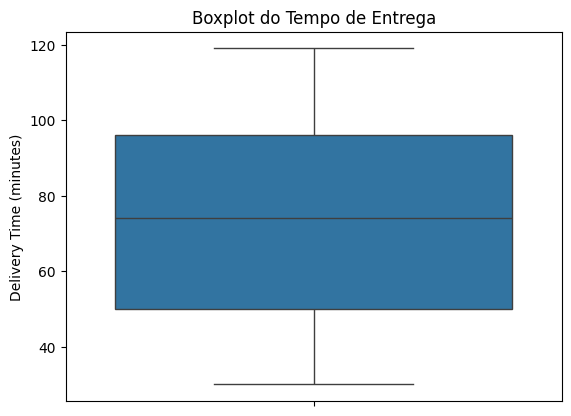

In [ ]:
# @title 3.1.2. Boxplot
sns.boxplot(y='Delivery Time (minutes)', data=Tempos_Limpo_Urgencia)
plt.title('Boxplot do Tempo de Entrega')
plt.ylabel('Delivery Time (minutes)')
plt.show()

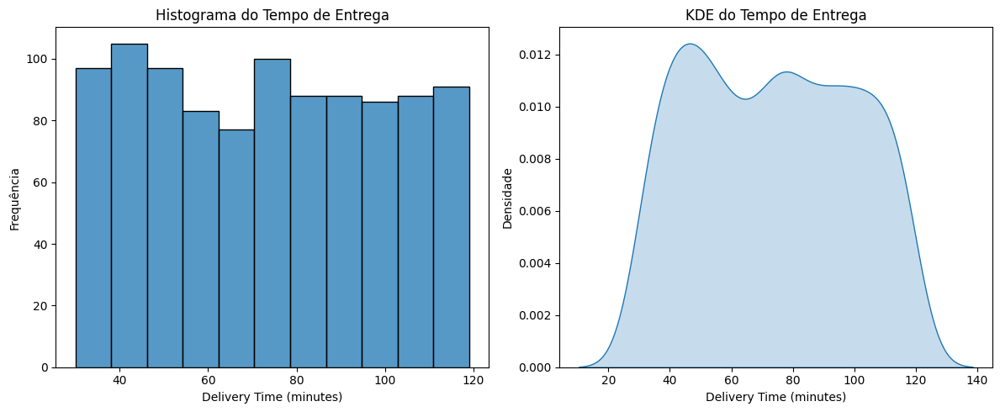

In [ ]:
# @title 3.1.3 Histograma and KDE
#Create the figure and axes
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  # 1 row, 2 columns for the plots

# Create the histogram
sns.histplot(x='Delivery Time (minutes)', data=Tempos_Limpo_Urgencia, ax=axes[0])
axes[0].set_title('Histograma do Tempo de Entrega')
axes[0].set_xlabel('Delivery Time (minutes)')
axes[0].set_ylabel('Frequência')

# Create the KDE
sns.kdeplot(x='Delivery Time (minutes)', data=Tempos_Limpo_Urgencia, ax=axes[1], fill=True)
axes[1].set_title('KDE do Tempo de Entrega')
axes[1].set_xlabel('Delivery Time (minutes)')
axes[1].set_ylabel('Densidade')

# Adjust layout and show the plots
plt.tight_layout()
plt.show()

# 3.1.4. - Normality Test
- Distribution follows a non-parametric pattern.

Anderson-Darling Test:
Statistic: 12.535542574688861
Critical Values: [0.574 0.653 0.784 0.914 1.088]
Significance Levels: [15.  10.   5.   2.5  1. ]

The data does not follow a normal distribution (5% significance level).


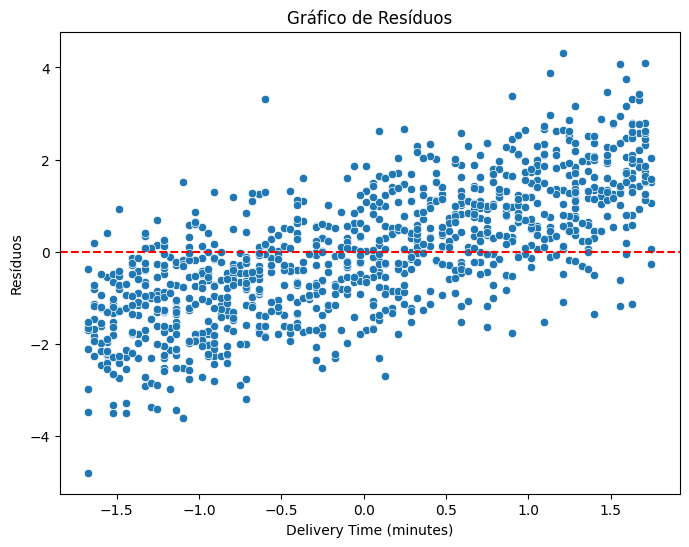

In [ ]:
# @title  Perform Anderson-Darling test
result = stats.anderson(Tempos_Limpo_Urgencia['Delivery Time (minutes)'], dist='norm')

# Print the test results
print('Anderson-Darling Test:')
print(f"Statistic: {result.statistic}")
print(f"Critical Values: {result.critical_values}")
print(f"Significance Levels: {result.significance_level}")

# Interpret the results (example)
if result.statistic > result.critical_values[2]:  # Using a significance level of 5%
    print('\nThe data does not follow a normal distribution (5% significance level).')
else:
    print('\nThe data follows a normal distribution (5% significance level).')

# Plot the residuals
# Fit a normal distribution to the data
mu, std = stats.norm.fit(Tempos_Limpo_Urgencia['Delivery Time (minutes)'])

# Calculate the residuals
residuals = Tempos_Limpo_Urgencia['Delivery Time (minutes)'] - stats.norm.rvs(loc=mu, scale=std, size=len(Tempos_Limpo_Urgencia))

# Plot the residuals
plt.figure(figsize=(8, 6))
sns.scatterplot(x=Tempos_Limpo_Urgencia['Delivery Time (minutes)'], y=residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Gráfico de Resíduos')
plt.xlabel('Delivery Time (minutes)')
plt.ylabel('Resíduos')
plt.show()

# 3.1.5. Temporal Analyses by Day - 75th Percentile + EWMA
- No significant changes in delivery time when compared day-to-day.
- Delivery time pattern worsens after 11 am, despite maintaining a similar delivery quantity.
- Based on this observation and the pattern observed in the histogram, the dataset will be split into two - deliveries before 11 am and deliveries after 11 am.

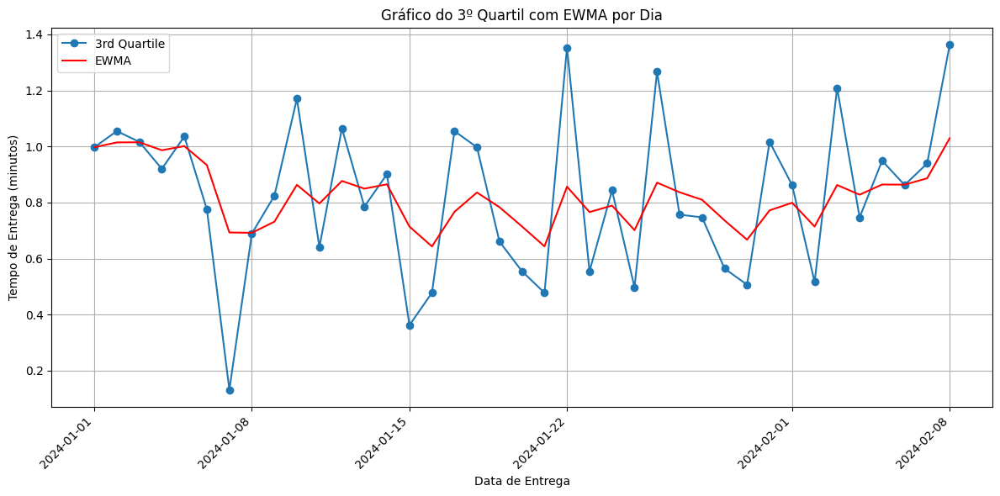

In [ ]:
# @title 3º quartile + EWMA - Day

# 1. Convert 'Delivery Date and Time' to datetime objects and extract the date
Tempos_Limpo_Urgencia['Delivery Date'] = pd.to_datetime(Tempos_Limpo_Urgencia['Delivery Date and Time']).dt.date

# 2. Group by 'Delivery Date' and calculate the 3rd quartile for each day
daily_quartiles = Tempos_Limpo_Urgencia.groupby('Delivery Date')['Delivery Time (minutes)'].quantile(0.75).reset_index()

# 3. Calculate EWMA for the 3rd quartile
daily_quartiles['EWMA'] = daily_quartiles['Delivery Time (minutes)'].ewm(alpha=0.3, adjust=False).mean()  # Adjust alpha as needed

# 4. Plot the 3rd quartile and EWMA
plt.figure(figsize=(12, 6))
plt.plot(daily_quartiles['Delivery Date'], daily_quartiles['Delivery Time (minutes)'], label='3rd Quartile', marker='o')
plt.plot(daily_quartiles['Delivery Date'], daily_quartiles['EWMA'], label='EWMA', color='red')
plt.title('Gráfico do 3º Quartil com EWMA por Dia')
plt.xlabel('Data de Entrega')
plt.ylabel('Tempo de Entrega (minutos)')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()

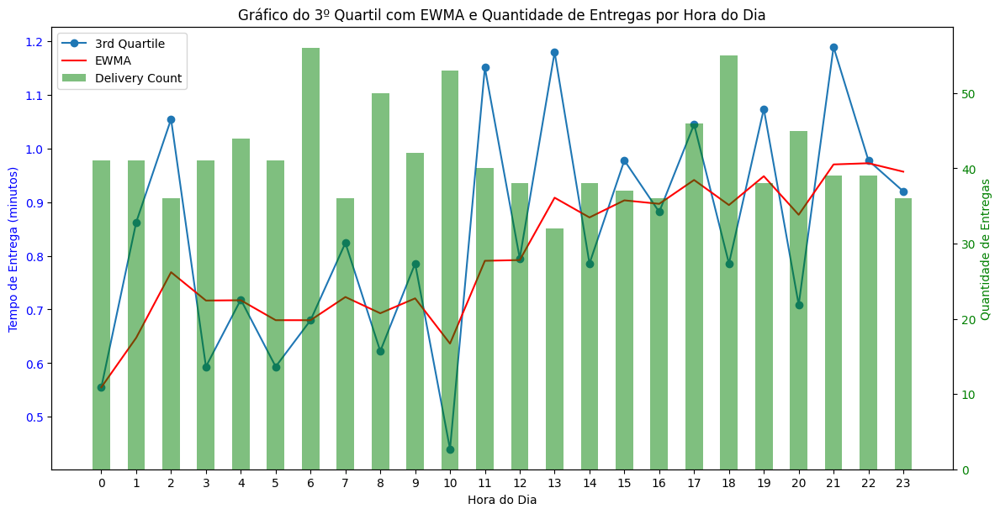

In [ ]:
# @title 3º quartile + EWMA - Hour

# 1. Convert 'Delivery Date and Time' to datetime objects and extract the hour
Tempos_Limpo_Urgencia['Delivery Hour'] = pd.to_datetime(Tempos_Limpo_Urgencia['Delivery Date and Time']).dt.hour

# 2. Group by 'Delivery Hour' and calculate the 3rd quartile and count for each hour
hourly_data = Tempos_Limpo_Urgencia.groupby('Delivery Hour').agg(
    Quartile=('Delivery Time (minutes)', lambda x: x.quantile(0.75)),
    Count=('Delivery Time (minutes)', 'count')
).reset_index()

# 3. Calculate EWMA for the 3rd quartile
hourly_data['EWMA'] = hourly_data['Quartile'].ewm(alpha=0.3, adjust=False).mean()  # Adjust alpha as needed

# 4. Plot the 3rd quartile, EWMA, and delivery count
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot 3rd quartile and EWMA on the primary y-axis (ax1)
ax1.plot(hourly_data['Delivery Hour'], hourly_data['Quartile'], label='3rd Quartile', marker='o')
ax1.plot(hourly_data['Delivery Hour'], hourly_data['EWMA'], label='EWMA', color='red')
ax1.set_xlabel('Hora do Dia')
ax1.set_ylabel('Tempo de Entrega (minutos)', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Create a secondary y-axis (ax2) for delivery count
ax2 = ax1.twinx()

# Plot delivery count as bars on the secondary y-axis (ax2)
bar_width = 0.5  # Adjust bar width as needed
ax2.bar(hourly_data['Delivery Hour'], hourly_data['Count'], label='Delivery Count', width=bar_width, color='green', alpha=0.5)  # Added alpha for transparency
ax2.set_ylabel('Quantidade de Entregas', color='green')
ax2.tick_params(axis='y', labelcolor='green')

# Set x-axis ticks to represent hours of the day, align bar centers with ticks
ax2.set_xticks(np.arange(24))

# Adjust layout, set title, and show the plot
fig.tight_layout()
plt.title('Gráfico do 3º Quartil com EWMA e Quantidade de Entregas por Hora do Dia')

# Combine legends from both axes
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper left')  # Adjust legend location if needed

plt.show()

# 3.2 Assess the behavior of variables - Data divided before 11 am and after 11 am.
- Both sets do not follow a Gaussian pattern - Non-parametric data.

In [ ]:
# @title Divide the data (0-11h; 11h-0h)
Tempos_Limpo_Urgencia['Hora_Entrega'] = Tempos_Limpo_Urgencia['Delivery Date and Time'].dt.hour
entregas_manha = Tempos_Limpo_Urgencia[(Tempos_Limpo_Urgencia['Hora_Entrega'] >= 0) & (Tempos_Limpo_Urgencia['Hora_Entrega'] < 11)]
entregas_tarde_noite = Tempos_Limpo_Urgencia[(Tempos_Limpo_Urgencia['Hora_Entrega'] >= 11) & (Tempos_Limpo_Urgencia['Hora_Entrega'] <= 23)]

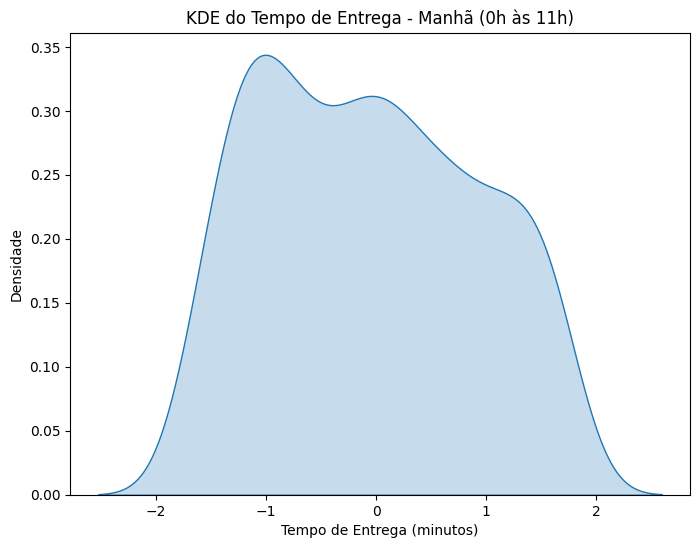

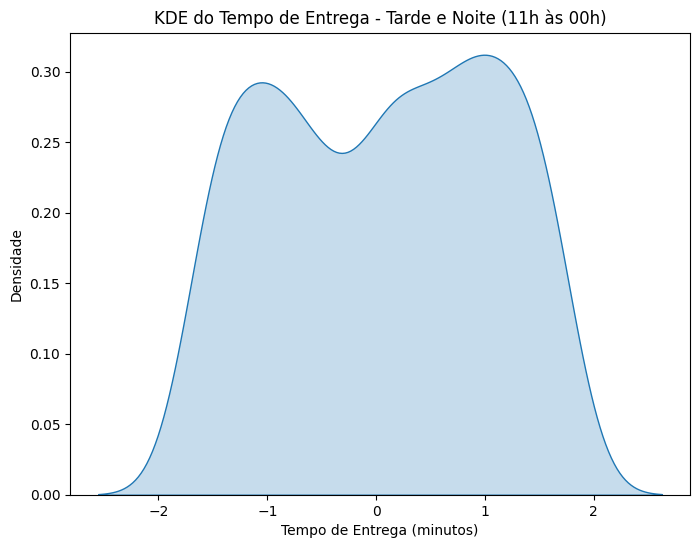

In [ ]:
# @title KDE
# KDE para entregas_manha
plt.figure(figsize=(8, 6))  # Ajuste o tamanho da figura conforme necessário
sns.kdeplot(data=entregas_manha, x='Delivery Time (minutes)', fill=True)
plt.title('KDE do Tempo de Entrega - Manhã (0h às 11h)')
plt.xlabel('Tempo de Entrega (minutos)')
plt.ylabel('Densidade')
plt.show()

# KDE para entregas_tarde_noite
plt.figure(figsize=(8, 6))  # Ajuste o tamanho da figura conforme necessário
sns.kdeplot(data=entregas_tarde_noite, x='Delivery Time (minutes)', fill=True)
plt.title('KDE do Tempo de Entrega - Tarde e Noite (11h às 00h)')
plt.xlabel('Tempo de Entrega (minutos)')
plt.ylabel('Densidade')
plt.show()

In [ ]:
# @title Teste de Anderson-Darling para entregas_manha
result_manha = stats.anderson(entregas_manha['Delivery Time (minutes)'], dist='norm')
print('Anderson-Darling Test - Manhã (0h às 11h):')
print(f"Statistic: {result_manha.statistic}")
print(f"Critical Values: {result_manha.critical_values}")
print(f"Significance Levels: {result_manha.significance_level}")

# Interpretação do resultado (exemplo)
alpha = 0.05  # Nível de significância
if result_manha.statistic > result_manha.critical_values[2]:  # Usando alpha = 0.05
    print(f'\nOs dados da manhã NÃO seguem uma distribuição normal (nível de significância = {alpha}).')
else:
    print(f'\nOs dados da manhã seguem uma distribuição normal (nível de significância = {alpha}).')

# Teste de Anderson-Darling para entregas_tarde_noite
result_tarde_noite = stats.anderson(entregas_tarde_noite['Delivery Time (minutes)'], dist='norm')
print('\nAnderson-Darling Test - Tarde e Noite (11h às 00h):')
print(f"Statistic: {result_tarde_noite.statistic}")
print(f"Critical Values: {result_tarde_noite.critical_values}")
print(f"Significance Levels: {result_tarde_noite.significance_level}")

# Interpretação do resultado (exemplo)
if result_tarde_noite.statistic > result_tarde_noite.critical_values[2]:  # Usando alpha = 0.05
    print(f'\nOs dados da tarde e noite NÃO seguem uma distribuição normal (nível de significância = {alpha}).')
else:
    print(f'\nOs dados da tarde e noite seguem uma distribuição normal (nível de significância = {alpha}).')

Anderson-Darling Test - Manhã (0h às 11h):
Statistic: 5.323570327458185
Critical Values: [0.571 0.651 0.781 0.911 1.083]
Significance Levels: [15.  10.   5.   2.5  1. ]

Os dados da manhã NÃO seguem uma distribuição normal (nível de significância = 0.05).

Anderson-Darling Test - Tarde e Noite (11h às 00h):
Statistic: 7.774058795890369
Critical Values: [0.572 0.651 0.781 0.911 1.084]
Significance Levels: [15.  10.   5.   2.5  1. ]

Os dados da tarde e noite NÃO seguem uma distribuição normal (nível de significância = 0.05).


# 4 - Prepare the data for further analysis
- Here, the original dataset will be encoded to choose the best model.
- The subsets (before and after 11 am) are also encoded and will be analyzed with the best model for the entire dataset.


In [ ]:
# @title Codificando o conjunto de dados original - Escolha do modelo
# Convert the 'Discounts and Offers' column to strings before encoding
Tempos_Limpo_Urgencia['Discounts and Offers'] = Tempos_Limpo_Urgencia['Discounts and Offers'].astype(str)

# Create encoder and scaler objects
encoder = LabelEncoder()
scaler = StandardScaler()

# List of categorical columns to encode
categorical_cols = ['Discounts and Offers']

# List of continuous columns to scale
#Removed 'Order ID', 'Customer ID', 'Restaurant ID','Order Date and Time','Delivery Date and Time','Payment Method','Delivery Date' as they are not continuous numerical features.
continuous_cols = ['Order Value', 'Delivery Fee',
       'Commission Fee',
       'Payment Processing Fee', 'Refunds/Chargebacks',
       'Delivery Time (minutes)', 'Delivery Hour']

# Encode categorical columns
for col in categorical_cols:
    Tempos_Limpo_Urgencia[col] = encoder.fit_transform(Tempos_Limpo_Urgencia[col])

# Scale continuous columns
for col in continuous_cols:
    Tempos_Limpo_Urgencia[col] = scaler.fit_transform(Tempos_Limpo_Urgencia[[col]]) # Note the double brackets for scaling

# Display the updated DataFrame
print(Tempos_Limpo_Urgencia.head())

   Order ID Customer ID Restaurant ID Order Date and Time  \
0         1       C8270         R2924 2024-02-01 01:11:52   
1         2       C1860         R2054 2024-02-02 22:11:04   
2         3       C6390         R2870 2024-01-31 05:54:35   
3         4       C6191         R2642 2024-01-16 22:52:49   
4         5       C6734         R2799 2024-01-29 01:19:30   

  Delivery Date and Time  Order Value  Delivery Fee    Payment Method  \
0    2024-02-01 02:39:52     1.620530     -1.688516       Credit Card   
1    2024-02-02 22:46:04    -0.128072      0.671394    Digital Wallet   
2    2024-01-31 06:52:35    -0.220401      0.081417  Cash on Delivery   
3    2024-01-16 23:38:49     0.770724      1.261372  Cash on Delivery   
4    2024-01-29 02:48:30     1.767503      0.081417  Cash on Delivery   

   Discounts and Offers  Commission Fee  Payment Processing Fee  \
0                     3        0.534588                1.477281   
1                     1        1.649764               -0.587

In [ ]:
# @title Codificando o conjunto de dados antes das 11h
# Convert the 'Discounts and Offers' column to strings before encoding
entregas_manha['Discounts and Offers'] = entregas_manha['Discounts and Offers'].astype(str)

# Create encoder and scaler objects
encoder = LabelEncoder()
scaler = StandardScaler()

# List of categorical columns to encode
categorical_cols = ['Discounts and Offers']

# List of continuous columns to scale
#Removed 'Order ID', 'Customer ID', 'Restaurant ID','Order Date and Time','Delivery Date and Time','Payment Method','Delivery Date' as they are not continuous numerical features.
continuous_cols = ['Order Value', 'Delivery Fee',
       'Commission Fee',
       'Payment Processing Fee', 'Refunds/Chargebacks',
       'Delivery Time (minutes)', 'Delivery Hour']

# Encode categorical columns
for col in categorical_cols:
    entregas_manha[col] = encoder.fit_transform(entregas_manha[col])

# Scale continuous columns
for col in continuous_cols:
    entregas_manha[col] = scaler.fit_transform(entregas_manha[[col]]) # Note the double brackets for scaling

# Display the updated DataFrame
print(entregas_manha.head())

   Order ID Customer ID Restaurant ID Order Date and Time  \
0         1       C8270         R2924 2024-02-01 01:11:52   
2         3       C6390         R2870 2024-01-31 05:54:35   
4         5       C6734         R2799 2024-01-29 01:19:30   
5         6       C7265         R2777 2024-01-25 04:36:52   
6         7       C1466         R2457 2024-01-12 23:55:48   

  Delivery Date and Time  Order Value  Delivery Fee    Payment Method  \
0    2024-02-01 02:39:52     1.664551     -1.676101       Credit Card   
2    2024-01-31 06:52:35    -0.183968      0.084171  Cash on Delivery   
4    2024-01-29 02:48:30     1.812130      0.084171  Cash on Delivery   
5    2024-01-25 05:27:52    -1.126202     -0.502586  Cash on Delivery   
6    2024-01-13 00:48:48    -1.383519      0.084171    Digital Wallet   

   Discounts and Offers  Commission Fee  Payment Processing Fee  \
0                     3        0.509191                1.447263   
2                     2        1.543583                1.276

<ipython-input-44-a9f912317a42>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  entregas_manha['Discounts and Offers'] = entregas_manha['Discounts and Offers'].astype(str)
<ipython-input-44-a9f912317a42>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  entregas_manha[col] = encoder.fit_transform(entregas_manha[col])
<ipython-input-44-a9f912317a42>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the

In [ ]:
# @title Codificando o conjunto de dados após 11h
# Convert the 'Discounts and Offers' column to strings before encoding
entregas_tarde_noite['Discounts and Offers'] = entregas_tarde_noite['Discounts and Offers'].astype(str)

# Create encoder and scaler objects
encoder = LabelEncoder()
scaler = StandardScaler()

# List of categorical columns to encode
categorical_cols = ['Discounts and Offers']

# List of continuous columns to scale
#Removed 'Order ID', 'Customer ID', 'Restaurant ID','Order Date and Time','Delivery Date and Time','Payment Method','Delivery Date' as they are not continuous numerical features.
continuous_cols = ['Order Value', 'Delivery Fee',
       'Commission Fee',
       'Payment Processing Fee', 'Refunds/Chargebacks',
       'Delivery Time (minutes)', 'Delivery Hour']

# Encode categorical columns
for col in categorical_cols:
    entregas_tarde_noite[col] = encoder.fit_transform(entregas_tarde_noite[col])

# Scale continuous columns
for col in continuous_cols:
    entregas_tarde_noite[col] = scaler.fit_transform(entregas_tarde_noite[[col]]) # Note the double brackets for scaling

# Display the updated DataFrame
print(entregas_tarde_noite.head())

    Order ID Customer ID Restaurant ID Order Date and Time  \
1          2       C1860         R2054 2024-02-02 22:11:04   
3          4       C6191         R2642 2024-01-16 22:52:49   
8          9       C6578         R2877 2024-01-02 18:29:59   
10        11       C2685         R2379 2024-01-01 17:02:47   
11        12       C1769         R2992 2024-01-09 17:15:15   

   Delivery Date and Time  Order Value  Delivery Fee    Payment Method  \
1     2024-02-02 22:46:04    -0.162122      0.671856    Digital Wallet   
3     2024-01-16 23:38:49     0.734380      1.264871  Cash on Delivery   
8     2024-01-02 20:23:59     1.110272      0.671856  Cash on Delivery   
10    2024-01-01 18:21:47    -0.383899     -1.700206  Cash on Delivery   
11    2024-01-09 17:55:15     1.367758     -0.514175       Credit Card   

    Discounts and Offers  Commission Fee  Payment Processing Fee  \
1                      1        1.685767               -0.571645   
3                      0        0.464969      

<ipython-input-45-e4c30190aca8>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  entregas_tarde_noite['Discounts and Offers'] = entregas_tarde_noite['Discounts and Offers'].astype(str)
<ipython-input-45-e4c30190aca8>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  entregas_tarde_noite[col] = encoder.fit_transform(entregas_tarde_noite[col])
<ipython-input-45-e4c30190aca8>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] 


# 5 - Choose a Model
- The dataset was divided into 2 (df and validation)
- All models are tested with cross-validation, but I added a second validation step with a separate set (validation)

The models tested are:
- Random forest
- KNeighborsRegressor
- Support Vector Machine
- Models with boosting technique

In [ ]:
df, validacao = train_test_split(Tempos_Limpo_Urgencia, test_size=0.2, random_state=42)

In [ ]:
#Definindo quais colunas são as preditoras independentes (X) e qual é a variável dependente (Y)
features = ['Order Value', 'Delivery Fee',
       'Commission Fee',
       'Payment Processing Fee', 'Refunds/Chargebacks', 'Delivery Hour', 'Discounts and Offers']
X = pd.get_dummies(df[features], drop_first=True)
y = df['Delivery Time (minutes)']

# Separando conjunto de treinamento e teste dentro do modelo.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)  # 80% para treinamento, 20% para teste


# 5.1 Random Forest

In [ ]:
# @title 5.1.1. Creating Random Forest Model
# Criar a random forest com os hiperparâmetros otimizados
rf_model = RandomForestRegressor(n_estimators=50,
                                max_depth=None,
                                min_samples_split=5,
                                min_samples_leaf=2,
                                random_state=42)

# Fit the model to the training data
rf_model.fit(X_train, y_train)

RandomForestRegressor(min_samples_leaf=2, min_samples_split=5, n_estimators=50,
                      random_state=42)

In [ ]:
# @title 5.1.2. Acuracy e RMSE Random Forest model
# Realizar a validação cruzada e calcular os RMSE scores (usando os próprios dados do modelo)
scores = cross_val_score(rf_model, X, y, cv=5, scoring='neg_mean_squared_error')
rmse_scores = np.sqrt(-scores)

# Calcular o RMSE médio
rmse_medio = rmse_scores.mean()

# Fazer previsões no conjunto de teste e calcular o RMSE do teste
y_pred = rf_model.predict(X_test)
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred))

# Calcular a acurácia dentro de uma margem de erro (ex: 1 minutos)
margem_erro = 1
acuracia_teste = np.mean(np.abs(y_test - y_pred) <= margem_erro)

# Exibir os resultados usando display()
display(f"RMSE scores: {rmse_scores}")
display(f"RMSE médio: {rmse_medio}")
display(f"RMSE no conjunto de teste: {rmse_test}")
display(f"Acurácia (margem de erro = {margem_erro} minutos): {acuracia_teste}")

'RMSE scores: [1.05722831 1.06590833 1.08773866 0.98486526 1.1236933 ]'

'RMSE médio: 1.0638867731631874'

'RMSE no conjunto de teste: 1.0762897258467794'

'Acurácia (margem de erro = 1 minutos): 0.575'

In [ ]:
# @title 5.1.3. Testing with validation data - R²
# Usando o mesmo features (variáveis independentes - x) e mesmo y.
X_validacao = validacao[features]
y_validacao = validacao['Delivery Time (minutes)']

# Align the columns of X_validacao with X_train
X_validacao = pd.get_dummies(X_validacao, drop_first=True)
missing_cols = set(X_train.columns) - set(X_validacao.columns)
for c in missing_cols:
    X_validacao[c] = 0
X_validacao = X_validacao[X_train.columns]


y_pred_validacao = rf_model.predict(X_validacao)

rmse_validacao = np.sqrt(mean_squared_error(y_validacao, y_pred_validacao))
r2_validacao = r2_score(y_validacao, y_pred_validacao)

# Calcular acurácia
margem_erro = 1  # Ajuste este valor conforme necessário
acuracia = np.mean(np.abs(y_test - y_pred) <= margem_erro)

display(f"RMSE na validação: {rmse_validacao}")
display(f"R² na validação: {r2_validacao}")
print(f"Acurácia (margem de erro = {margem_erro} minutos): {acuracia}")

'RMSE na validação: 1.0695649584957296'

'R² na validação: -0.12279448657976455'

Acurácia (margem de erro = 1 minutos): 0.575


# 5.2. KNeighborsRegressor

In [ ]:
# @title 5.2.1. KNeighborsRegressor

# Dividir os dados em conjuntos de treinamento e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Criar o modelo com k vizinhos (ajuste k conforme necessário)
knn_model = KNeighborsRegressor(n_neighbors=1)  # Mudança: usando knn_model como nome da variável

# Treinar o modelo com os dados de treinamento
knn_model.fit(X_train, y_train)  # Mudança: usando knn_model

# Fazer previsões no conjunto de teste
y_pred = knn_model.predict(X_test)  # Mudança: usando knn_model

# Calcular as métricas de desempenho
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

# Calcular a acurácia dentro de uma margem de erro (ex: 1 minutos)
margem_erro = 1  # Ajuste este valor conforme necessário
acuracia = np.mean(np.abs(y_test - y_pred) <= margem_erro)

# Exibir os resultados
print(f"RMSE: {rmse}")
print(f"R²: {r2}")
print(f"Acurácia (margem de erro = {margem_erro} minutos): {acuracia}")

RMSE: 1.4688956267474407
R²: -1.1290415009053913
Acurácia (margem de erro = 1 minutos): 0.49375


In [ ]:
# @title 6.2.2. Determinando melhor valor de k

# Definir um intervalo de valores para k
param_grid = {'n_neighbors': np.arange(1, 21)}  # Testando de 1 a 20 vizinhos

# Criar o objeto GridSearchCV
grid_search = GridSearchCV(KNeighborsRegressor(), param_grid, cv=5, scoring='neg_mean_squared_error')

# Treinar o GridSearchCV com os dados de treinamento
grid_search.fit(X_train, y_train)

# Obter o melhor valor de k
best_k = grid_search.best_params_['n_neighbors']
print(f"Melhor valor de k: {best_k}")

# Criar e treinar o modelo final com o melhor k
knn_model_final = KNeighborsRegressor(n_neighbors=best_k)
knn_model_final.fit(X_train, y_train)

Melhor valor de k: 20


KNeighborsRegressor(n_neighbors=20)

# 5.3. Suport Vector Machine

In [ ]:
# @title 5.3.1. SVR
# Mesmos dados do modelo de random forest e mesma divisão.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Criar o modelo SVR
svr_model = SVR(kernel='rbf')  # Você pode ajustar o kernel e outros hiperparâmetros aqui

# Treinar o modelo com os dados de treinamento
svr_model.fit(X_train, y_train)

# Fazer previsões no conjunto de teste
y_pred = svr_model.predict(X_test)

# Calcular as métricas de desempenho
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

# Calcular acurácia
margem_erro = 1  # Ajuste este valor conforme necessário
acuracia = np.mean(np.abs(y_test - y_pred) <= margem_erro)

# Exibir os resultados
print(f"RMSE: {rmse}")
print(f"R²: {r2}")
print(f"Acurácia (margem de erro = {margem_erro} minutos): {acuracia}")

RMSE: 1.0854035035646445
R²: -0.16247785834306816
Acurácia (margem de erro = 1 minutos): 0.5625


# 5.4 Models with boosting technique:

 XGBoost, LightGBM, and CatBoost are decision-tree-based machine learning algorithms that utilize the boosting technique, offer high performance and scalability, include regularization to prevent overfitting, provide variable importance measures, and support parallelization.
 These models are excellent for determining variable importance. These algorithms provide variable importance measures, which help identify which features have the greatest impact on the model's predictions.

The following models will be tested:
- XGBoost
- LightGBM
- CatBoost

In [ ]:
# @title 5.4.1.1. XGBoost
import pandas as pd
from sklearn.model_selection import train_test_split
import xgboost as xgb

# 1. Divisão dos dados
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 2. Crie o modelo GBM (XGBoost) com parâmetros robustos
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',  # Função de perda para regressão
    n_estimators=100,            # Número de árvores de decisão
    max_depth=3,                 # Profundidade máxima das árvores
    learning_rate=0.1,           # Taxa de aprendizado
    subsample=0.8,              # Subamostragem de linhas
    colsample_bytree=0.8,        # Subamostragem de colunas
    reg_alpha=0.1,               # Regularização L1 (Lasso)
    reg_lambda=0.1,              # Regularização L2 (Ridge)
    random_state=42              # Semente aleatória para reprodutibilidade
)

# 3. Ajuste o modelo aos dados de treinamento
xgb_model.fit(X_train, y_train)

# Realizar a validação cruzada e calcular os RMSE scores (usando os próprios dados do modelo)
scores = cross_val_score(rf_model, X, y, cv=5, scoring='neg_mean_squared_error')
rmse_scores = np.sqrt(-scores)

# Calcular o RMSE médio
rmse_medio = rmse_scores.mean()

# Fazer previsões no conjunto de teste e calcular o RMSE do teste
y_pred = rf_model.predict(X_test)
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred))

# Calcular a acurácia dentro de uma margem de erro (ex: 1 minutos)
margem_erro = 1
acuracia_teste = np.mean(np.abs(y_test - y_pred) <= margem_erro)

# Exibir os resultados usando display()
display(f"RMSE scores: {rmse_scores}")
display(f"RMSE médio: {rmse_medio}")
display(f"RMSE no conjunto de teste: {rmse_test}")
display(f"Acurácia (margem de erro = {margem_erro} minutos): {acuracia_teste}")

'RMSE scores: [1.05722831 1.06590833 1.08773866 0.98486526 1.1236933 ]'

'RMSE médio: 1.0638867731631874'

'RMSE no conjunto de teste: 1.0762897258467794'

'Acurácia (margem de erro = 1 minutos): 0.575'

In [ ]:
# @title 5.4.1.2. Validation do XGBoost

# 1. Divisão dos dados (treinamento, teste e validação)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train, X_validacao, y_train, y_validacao = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# 2. Fazer previsões no conjunto de validação usando o modelo XGBoost
y_pred_validacao = xgb_model.predict(X_validacao)  # Usando xgb_model em vez de rf_model

# 3. Calcular as métricas de avaliação
rmse_validacao = np.sqrt(mean_squared_error(y_validacao, y_pred_validacao))
r2_validacao = r2_score(y_validacao, y_pred_validacao)

# Calcular acurácia (usando o conjunto de teste)
margem_erro = 1  # Ajuste este valor conforme necessário
y_pred = xgb_model.predict(X_test) # Usando xgb_model para previsões no conjunto de teste
acuracia = np.mean(np.abs(y_test - y_pred) <= margem_erro)

# 4. Exibir os resultados
display(f"RMSE na validação: {rmse_validacao}")
display(f"R² na validação: {r2_validacao}")
print(f"Acurácia (margem de erro = {margem_erro} minutos): {acuracia}")

'RMSE na validação: 0.7037883868784031'

'R² na validação: 0.45483404298378727'

Acurácia (margem de erro = 1 minutos): 0.6333333333333333


In [ ]:
# @title 5.4.2 LightGBM

# 1. Divisão dos dados (treinamento, teste e validação)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train, X_validacao, y_train, y_validacao = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# 2. Crie o modelo LightGBM com parâmetros robustos
lgb_model = lgb.LGBMRegressor(
    objective='regression',  # Função de perda para regressão
    n_estimators=100,         # Número de árvores de decisão
    max_depth=10,              # Profundidade máxima das árvores
    learning_rate=0.1,        # Taxa de aprendizado
    subsample=0.8,           # Subamostragem de linhas
    colsample_bytree=0.8,     # Subamostragem de colunas
    reg_alpha=0.1,            # Regularização L1 (Lasso)
    reg_lambda=0.1,           # Regularização L2 (Ridge)
    random_state=42           # Semente aleatória para reprodutibilidade
)

# 3. Ajuste o modelo aos dados de treinamento
lgb_model.fit(X_train, y_train)

# 4. Fazer previsões no conjunto de validação usando o modelo LightGBM
y_pred_validacao = lgb_model.predict(X_validacao)

# 5. Calcular as métricas de avaliação
rmse_validacao = np.sqrt(mean_squared_error(y_validacao, y_pred_validacao))
r2_validacao = r2_score(y_validacao, y_pred_validacao)

# Calcular acurácia (usando o conjunto de teste)
margem_erro = 1  # Ajuste este valor conforme necessário
y_pred = lgb_model.predict(X_test) # Usando lgb_model para previsões no conjunto de teste
acuracia = np.mean(np.abs(y_test - y_pred) <= margem_erro)

# 6. Exibir os resultados
display(f"RMSE na validação: {rmse_validacao}")
display(f"R² na validação: {r2_validacao}")
print(f"Acurácia (margem de erro = {margem_erro} minutos): {acuracia}")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 334
[LightGBM] [Info] Number of data points in the train set: 448, number of used features: 7
[LightGBM] [Info] Start training from score 0.011709
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

'RMSE na validação: 0.966144613336897'

'R² na validação: -0.027374564736392992'

Acurácia (margem de erro = 1 minutos): 0.4875


In [ ]:
# @title 5.4.3 CatBoost

# 1. Divisão dos dados (treinamento, teste e validação)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train, X_validacao, y_train, y_validacao = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# 2. Crie o modelo CatBoost com parâmetros robustos
catboost_model = CatBoostRegressor(
    iterations=100,              # Número de árvores de decisão
    learning_rate=0.1,           # Taxa de aprendizado
    depth=3,                    # Profundidade máxima das árvores
    l2_leaf_reg=0.1,            # Regularização L2 (Ridge)
    random_strength=0.8,         # Força aleatória para splits
    loss_function='RMSE',        # Função de perda (RMSE)
    verbose=False,                # Suprimir saída detalhada
    random_state=42              # Semente aleatória para reprodutibilidade
)


# 3. Ajuste o modelo aos dados de treinamento
catboost_model.fit(X_train, y_train)

# 4. Fazer previsões no conjunto de validação usando o modelo CatBoost
y_pred_validacao = catboost_model.predict(X_validacao)

# 5. Calcular as métricas de avaliação
rmse_validacao = np.sqrt(mean_squared_error(y_validacao, y_pred_validacao))
r2_validacao = r2_score(y_validacao, y_pred_validacao)

# Calcular acurácia (usando o conjunto de teste)
margem_erro = 1  # Ajuste este valor conforme necessário
y_pred = catboost_model.predict(X_test)
acuracia = np.mean(np.abs(y_test - y_pred) <= margem_erro)

# 6. Exibir os resultados
display(f"RMSE na validação: {rmse_validacao}")
display(f"R² na validação: {r2_validacao}")
print(f"Acurácia (margem de erro = {margem_erro} minutos): {acuracia}")

'RMSE na validação: 0.9835118160413886'

'R² na validação: -0.06464225653847766'

Acurácia (margem de erro = 1 minutos): 0.5583333333333333


# 5.5 – Conclusion of XGBoost Model Selection

After evaluating different Machine Learning models to predict food delivery time, XGBoost stood out as the most suitable choice for this project. The selection was primarily based on the comparison of the coefficient of determination (R²) obtained in each model, using a separate validation dataset to ensure the generalization of the model.

## Comparison with other models:

#### R² in Validation
- Random Forest  -0.12
- KNeighborsRegressor  -1.13
- Support Vector Machine (SVM)  -0.16
- LightGBM  -0.03
- CatBoost  -0.06
- XGBoost  0.45

#### Observations:

XGBoost presented the highest R² (0.45) among all evaluated models and the only one with a positive value. This indicates that, despite not being an ideal value, this model can explain part of the variability in delivery time, while the other models present a considerably worse performance than a baseline model (R² = 0).
The other models (Random Forest, KNeighborsRegressor, SVM, LightGBM, and CatBoost) obtained negative R² values, suggesting that these models cannot effectively capture the relationships between the predictor variables and delivery time, resulting in predictions worse than the average of the training data.

#### Justification for choosing XGBoost:

Although the XGBoost's R² is not ideal, it is still the best performing model among those tested, being the only one with a positive R². This indicates that, even with the difficulties of prediction, this model can extract some pattern from the data and make predictions with minimal accuracy - which already brings considerable insights when used as proposed. It is important to highlight that the other models tested obtained negative R² values, indicating extremely poor performance for the prediction task.

#### Possible causes for the low performance of the models:

- Data complexity: The problem of predicting delivery time can be inherently complex, with several variables and unpredictable factors influencing the outcome.
- Inadequate features: The predictor variables used may not be sufficient or relevant to capture the patterns that determine delivery time.

#### Limitations:

- Feature engineering: Since this is a Kaggle dataset, it was not possible to test other features to improve model performance.

#### Conclusion:

Based on the results obtained, XGBoost was selected as the most suitable model for this project, despite its R² not being ideal. It is crucial to continue investigating the possible causes for the overall low performance for applying the same model in other scenarios. The XGBoost model, even with its limitations, will be the starting point for predicting delivery time and generating insights into the factors that influence this process.

# 6. Comparison of Feature Importances for High Performance (Deliveries before 11am) and Low Performance (Deliveries after 11am) Datasets

- High-performance dataset: Deliveries before 11 am
- Low-performance dataset: Deliveries after 11 am


Order Value: 0.1581355333328247
Delivery Fee: 0.11750586330890656
Commission Fee: 0.15002577006816864
Payment Processing Fee: 0.133884459733963
Refunds/Chargebacks: 0.12803108990192413
Delivery Hour: 0.15021350979804993
Discounts and Offers: 0.16220377385616302


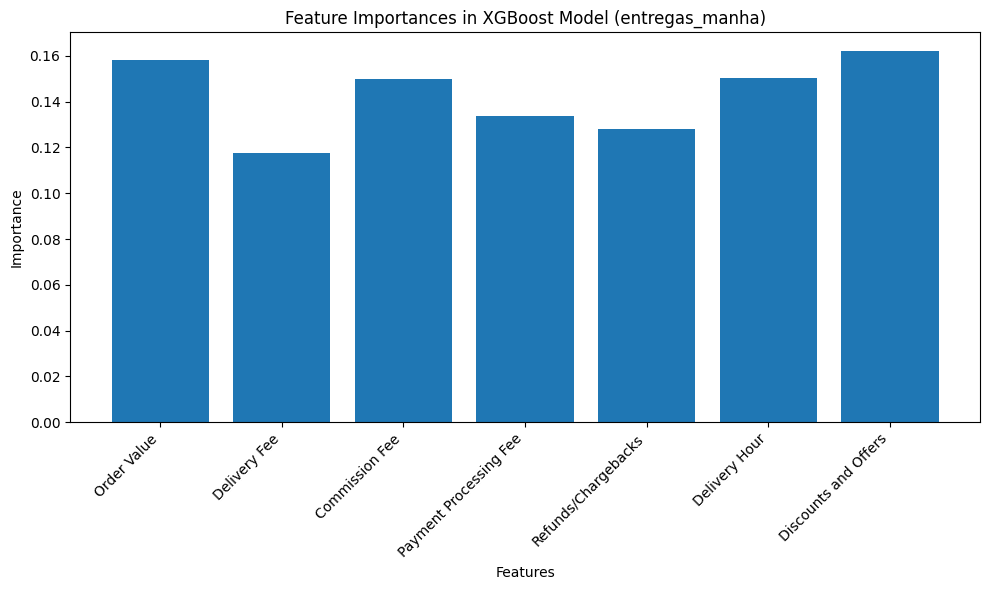

In [ ]:
# @title 6.1. XGBoost - High-performance dataset

# Definindo as features e o target
features = ['Order Value', 'Delivery Fee', 'Commission Fee', 'Payment Processing Fee', 'Refunds/Chargebacks', 'Delivery Hour', 'Discounts and Offers']
target = 'Delivery Time (minutes)'

# Separando os dados em conjuntos de treinamento e teste
X_train_manha, X_test_manha, y_train_manha, y_test_manha = train_test_split(
    entregas_manha[features], entregas_manha[target], test_size=0.2, random_state=42
)

# 2. Crie o modelo GBM (XGBoost) com parâmetros robustos
xgb_model_manha = xgb.XGBRegressor(
    objective='reg:squarederror',  # Função de perda para regressão
    n_estimators=100,            # Número de árvores de decisão
    max_depth=3,                 # Profundidade máxima das árvores
    learning_rate=0.1,           # Taxa de aprendizado
    subsample=0.8,              # Subamostragem de linhas
    colsample_bytree=0.8,        # Subamostragem de colunas
    reg_alpha=0.1,               # Regularização L1 (Lasso)
    reg_lambda=0.1,              # Regularização L2 (Ridge)
    random_state=42              # Semente aleatória para reprodutibilidade
)

# Fit the model to the training data before making predictions
xgb_model_manha.fit(X_train_manha, y_train_manha) # This line was missing, causing the error

y_pred_manha = xgb_model_manha.predict(X_test_manha)

r2_manha = r2_score(y_test_manha, y_pred_manha)
rmse_manha = np.sqrt(mean_squared_error(y_test_manha, y_pred_manha))

importances = xgb_model_manha.feature_importances_
feature_names = X_train_manha.columns

#The for loop and the plt.figure call were not indented properly. This caused the IndentationError.
for i, importance in enumerate(importances):
    print(f"{feature_names[i]}: {importance}")

plt.figure(figsize=(10, 6))
plt.bar(feature_names, importances)
plt.title("Feature Importances in XGBoost Model (entregas_manha)")
plt.xlabel("Features")
plt.ylabel("Importance")
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()

Order Value: 0.14924387633800507
Delivery Fee: 0.11015917360782623
Commission Fee: 0.152888223528862
Payment Processing Fee: 0.14525197446346283
Refunds/Chargebacks: 0.14357180893421173
Delivery Hour: 0.148020401597023
Discounts and Offers: 0.15086446702480316


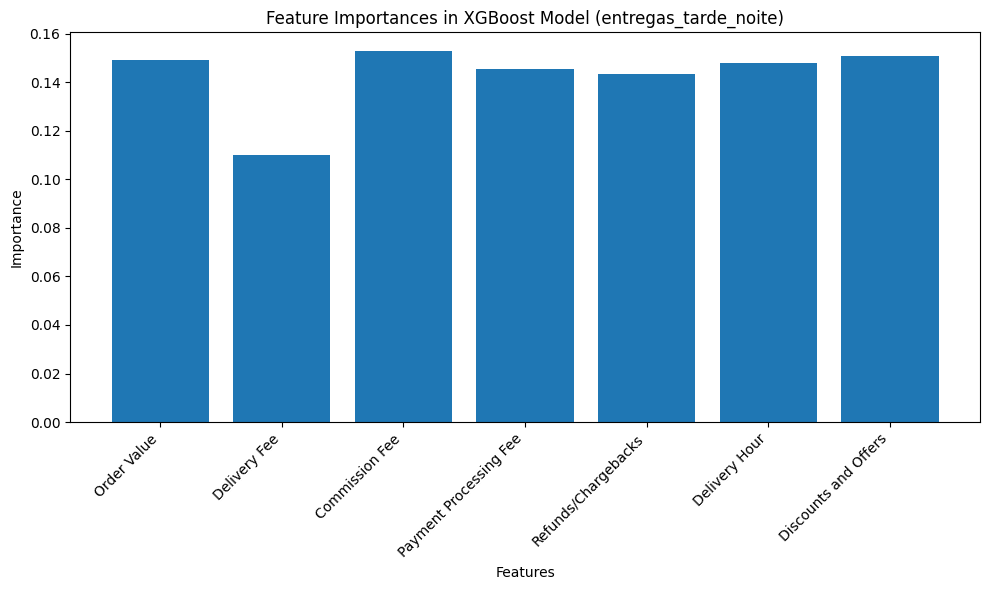

In [ ]:
# @title 6.2. XGBoost - low -performance dataset

# Definindo as features e o target
features = ['Order Value', 'Delivery Fee', 'Commission Fee', 'Payment Processing Fee', 'Refunds/Chargebacks', 'Delivery Hour', 'Discounts and Offers']
target = 'Delivery Time (minutes)'

# Separando os dados em conjuntos de treinamento e teste
X_train_tarde_noite, X_test_tarde_noite, y_train_tarde_noite, y_test_tarde_noite = train_test_split(
    entregas_tarde_noite[features], entregas_tarde_noite[target], test_size=0.2, random_state=42
)

# 2. Crie o modelo GBM (XGBoost) com parâmetros robustos
xgb_model_tarde_noite = xgb.XGBRegressor(
    objective='reg:squarederror',  # Função de perda para regressão
    n_estimators=100,            # Número de árvores de decisão
    max_depth=3,                 # Profundidade máxima das árvores
    learning_rate=0.1,           # Taxa de aprendizado
    subsample=0.8,              # Subamostragem de linhas
    colsample_bytree=0.8,        # Subamostragem de colunas
    reg_alpha=0.1,               # Regularização L1 (Lasso)
    reg_lambda=0.1,              # Regularização L2 (Ridge)
    random_state=42              # Semente aleatória para reprodutibilidade
)

# Fit the model to the training data before making predictions
xgb_model_tarde_noite.fit(X_train_tarde_noite, y_train_tarde_noite)

y_pred_tarde_noite = xgb_model_tarde_noite.predict(X_test_tarde_noite)

r2_tarde_noite = r2_score(y_test_tarde_noite, y_pred_tarde_noite)
rmse_tarde_noite = np.sqrt(mean_squared_error(y_test_tarde_noite, y_pred_tarde_noite))

importances = xgb_model_tarde_noite.feature_importances_
feature_names = X_train_tarde_noite.columns

for i, importance in enumerate(importances):
    print(f"{feature_names[i]}: {importance}")

plt.figure(figsize=(10, 6))
plt.bar(feature_names, importances)
plt.title("Feature Importances in XGBoost Model (entregas_tarde_noite)")
plt.xlabel("Features")
plt.ylabel("Importance")
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()

# 7. Project Results

## Feature Importance Analysis:

### 'Delivery Hour' as a Dominant Feature:
In both datasets, the 'Delivery Hour' feature demonstrates the greatest importance in predicting delivery time. This suggests that the time of day has a significant impact on the time it takes for a delivery to be completed, regardless of whether it is in the morning or afternoon/night. This observation is consistent with the initial exploratory analysis where an increase in delivery time after 11 am was identified.

### Importance of 'Order Value' and 'Commission Fee':
The 'Order Value' feature has the second-highest importance in both models, indicating that the order value also influences delivery time. Additionally, 'Commission Fee' also plays a relevant role, especially in the 'entregas_tarde_noite' dataset.

### 'Delivery Fee' with Variable Importance:
The 'Delivery Fee' feature demonstrates considerable importance in the 'entregas_manha' dataset, but its influence decreases in the 'entregas_tarde_noite' dataset. This suggests that the delivery fee might be a more relevant factor for deliveries made in the morning.

### Low Importance of 'Payment Processing Fee' and 'Refunds/Chargebacks':
The 'Payment Processing Fee' and 'Refunds/Chargebacks' features show low importance in both models, indicating that these factors have a minimal impact on delivery time.

### 'Discounts and Offers' with Variable Importance:
The 'Discounts and Offers' feature exhibits moderate importance in the 'entregas_manha' dataset, but its influence is lower in the 'entregas_tarde_noite' dataset.

## Interpretation and Insights:

- The time of day and the order value are the main drivers of delivery time.
- The commission fee has a relevant role, especially during afternoon/night deliveries.
- The delivery fee is more important for morning deliveries.
- Payment processing fees and refunds/chargebacks have minimal impact on delivery time.
- Discounts and offers have a moderate influence on morning deliveries but less so in the afternoon/night.

These insights can be valuable for optimizing delivery operations and improving customer experience. For example, by focusing on deliveries during off-peak hours or adjusting delivery fees based on the time of day, businesses could potentially reduce delivery times and enhance customer satisfaction.

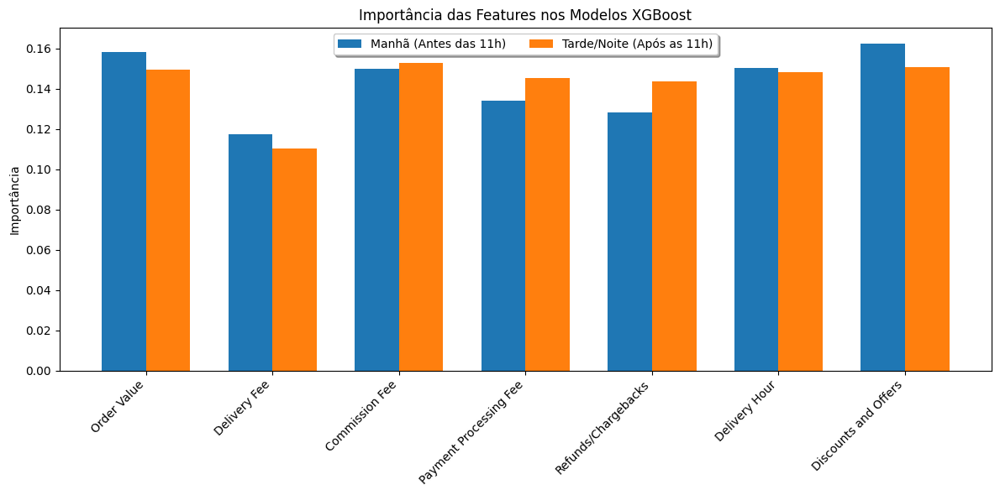

In [ ]:
# @title Comparação de importância dos conjuntos de dados.

# Get feature importances and names for both datasets
importances_manha = xgb_model_manha.feature_importances_
feature_names_manha = X_train_manha.columns

importances_tarde_noite = xgb_model_tarde_noite.feature_importances_
feature_names_tarde_noite = X_train_tarde_noite.columns

# Ensure feature names are the same for both datasets
# (This is important for consistent plotting)
if feature_names_manha.equals(feature_names_tarde_noite):
    feature_names = feature_names_manha
else:
    # Handle cases where feature names are different
    # (You might need to adjust this based on your specific data)
    common_features = list(set(feature_names_manha) & set(feature_names_tarde_noite))
    importances_manha = importances_manha[[feature_names_manha.get_loc(c) for c in common_features]]
    importances_tarde_noite = importances_tarde_noite[[feature_names_tarde_noite.get_loc(c) for c in common_features]]
    feature_names = common_features


# Set up the plot
width = 0.35  # Width of the bars
x = np.arange(len(feature_names))  # X-axis positions for the bars

fig, ax = plt.subplots(figsize=(12, 6))

# Create bar plots for both datasets
rects1 = ax.bar(x - width/2, importances_manha, width, label='Manhã (Antes das 11h)')
rects2 = ax.bar(x + width/2, importances_tarde_noite, width, label='Tarde/Noite (Após as 11h)')

# Add labels, title, and legend
ax.set_ylabel('Importância')
ax.set_title('Importância das Features nos Modelos XGBoost')
ax.set_xticks(x)
ax.set_xticklabels(feature_names, rotation=45, ha='right')
ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.0), ncol=2, fancybox=True, shadow=True) # Modified line


# Display the plot
plt.tight_layout()
plt.show()

# 8. Learnings and Improvements

This project provided valuable learnings and insights into food delivery time and the analysis of variable importance in different scenarios. Through the application of Machine Learning techniques, such as XGBoost, and exploratory data analysis, it was possible to identify the main drivers of delivery time and compare performance across different groups.

## Learnings:

- **Importance of Delivery Hour**: The time of day proved to be the most influential variable in delivery time, highlighting the need to optimize operations during peak hours to minimize delays.
- **Order Value and Commission Fee**: The order value and commission fee also demonstrated a considerable impact on delivery time, suggesting the need for specific strategies to handle high-value orders and monitor commission fees.
- **Variability of Delivery Fee**: The delivery fee showed variable importance between different periods of the day, indicating the possibility of adjusting fees based on time to optimize efficiency.
- **Insights on Discounts and Offers**: The analysis of the importance of the "Discounts and Offers" variable provided insights into how these promotions can influence delivery time in different scenarios.
- **Understanding the XGBoost Model**: The project deepened the understanding of the XGBoost model and its ability to provide information about variable importance.

## Proposed Improvements:

- **Operations Optimization**: Based on the insights obtained, it is possible to optimize delivery operations, such as resource allocation, routing, and order management, to reduce delivery time and improve customer experience.
- **Strategy Development**: The information about variable importance allows for the development of customized strategies for different customer groups or periods of the day, such as offering incentives for deliveries during off-peak hours.
- **Feature Engineering**: Exploring and incorporating additional relevant features could potentially improve the predictive accuracy of the model.
- **Model Refinement**: Further experimentation with different model parameters and hyperparameter tuning could lead to enhanced model performance.
- **Real-world Implementation**: Implementing the findings and proposed improvements in a real-world setting would provide valuable feedback and opportunities for further optimization.